In [ ]:
from torch.optim import AdamW
%load_ext autoreload
%autoreload 2
from torch.optim.lr_scheduler import CosineAnnealingLR
import torch.nn as nn

from models.unet_model import UNet
from utils.data import create_dataloaders
from utils.train import run_training
from utils.evaluation import visualise_batch_predictions, evaluate

In [ ]:
seed = 42
torch.manual_seed(seed)

In [ ]:
max_epochs = 10
batch_size = 16
learning_rate = 1e-5
project_name = "DeepLabV3plus Baselines"
weight_tensor = torch.tensor([1.0, 1.0], device=device)



In [ ]:

from models.deeplabv3plus import fetch_deeplabv3

In [ ]:
#Should be cuda:0 in colab and cpu in local.
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
DATA_PATH = config.PATH_TO_DATA


cuda:0


### RGB pre-trained

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = fetch_deeplabv3(output_stride=8, num_classes=2).to(device)
model.to(device)
optimizer = AdamW(model.parameters(),
                              lr=learning_rate,
                              weight_decay=1e-2)

scheduler = CosineAnnealingLR(optimizer, max_epochs)
criterion = torch.nn.CrossEntropyLoss()


Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth
100%|██████████| 170M/170M [00:02<00:00, 66.6MB/s]


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


wandb: Currently logged in as: jprado (ipeo_project). Use `wandb login --relogin` to force relogin


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 1-0 batch_loss=7.07e-01 batch_acc=0.654
Train Epoch: 1-6 batch_loss=7.10e-01 batch_acc=0.629
Train Epoch: 1-12 batch_loss=4.82e-01 batch_acc=0.781
Train Epoch: 1-18 batch_loss=5.07e-01 batch_acc=0.770
Train Epoch: 1-24 batch_loss=5.15e-01 batch_acc=0.742
Train Epoch: 1-30 batch_loss=5.76e-01 batch_acc=0.707
Train Epoch: 1-36 batch_loss=5.95e-01 batch_acc=0.681
Train Epoch: 1-42 batch_loss=4.88e-01 batch_acc=0.754
Train Epoch: 1-48 batch_loss=4.60e-01 batch_acc=0.782
Train Epoch: 1-54 batch_loss=3.66e-01 batch_acc=0.855
Train Epoch: 1-60 batch_loss=3.59e-01 batch_acc=0.847


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 2-0 batch_loss=3.49e-01 batch_acc=0.858
Train Epoch: 2-6 batch_loss=3.84e-01 batch_acc=0.822
Train Epoch: 2-12 batch_loss=3.08e-01 batch_acc=0.886
Train Epoch: 2-18 batch_loss=2.96e-01 batch_acc=0.880
Train Epoch: 2-24 batch_loss=5.02e-01 batch_acc=0.769
Train Epoch: 2-30 batch_loss=4.89e-01 batch_acc=0.759
Train Epoch: 2-36 batch_loss=5.60e-01 batch_acc=0.728
Train Epoch: 2-42 batch_loss=4.40e-01 batch_acc=0.795
Train Epoch: 2-48 batch_loss=3.61e-01 batch_acc=0.847
Train Epoch: 2-54 batch_loss=3.46e-01 batch_acc=0.869
Train Epoch: 2-60 batch_loss=3.30e-01 batch_acc=0.864


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 3-0 batch_loss=2.91e-01 batch_acc=0.881
Train Epoch: 3-6 batch_loss=3.71e-01 batch_acc=0.831
Train Epoch: 3-12 batch_loss=3.31e-01 batch_acc=0.861
Train Epoch: 3-18 batch_loss=2.54e-01 batch_acc=0.902
Train Epoch: 3-24 batch_loss=4.04e-01 batch_acc=0.817
Train Epoch: 3-30 batch_loss=5.76e-01 batch_acc=0.713
Train Epoch: 3-36 batch_loss=3.77e-01 batch_acc=0.828
Train Epoch: 3-42 batch_loss=4.19e-01 batch_acc=0.800
Train Epoch: 3-48 batch_loss=3.55e-01 batch_acc=0.851
Train Epoch: 3-54 batch_loss=3.17e-01 batch_acc=0.887
Train Epoch: 3-60 batch_loss=2.94e-01 batch_acc=0.889


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 4-0 batch_loss=2.89e-01 batch_acc=0.880
Train Epoch: 4-6 batch_loss=3.16e-01 batch_acc=0.868
Train Epoch: 4-12 batch_loss=3.28e-01 batch_acc=0.864
Train Epoch: 4-18 batch_loss=2.12e-01 batch_acc=0.931
Train Epoch: 4-24 batch_loss=3.84e-01 batch_acc=0.830
Train Epoch: 4-30 batch_loss=4.10e-01 batch_acc=0.811
Train Epoch: 4-36 batch_loss=3.33e-01 batch_acc=0.849
Train Epoch: 4-42 batch_loss=3.92e-01 batch_acc=0.830
Train Epoch: 4-48 batch_loss=3.46e-01 batch_acc=0.851
Train Epoch: 4-54 batch_loss=2.90e-01 batch_acc=0.905
Train Epoch: 4-60 batch_loss=2.97e-01 batch_acc=0.871


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 5-0 batch_loss=2.55e-01 batch_acc=0.909
Train Epoch: 5-6 batch_loss=2.81e-01 batch_acc=0.889
Train Epoch: 5-12 batch_loss=2.65e-01 batch_acc=0.908
Train Epoch: 5-18 batch_loss=2.12e-01 batch_acc=0.923
Train Epoch: 5-24 batch_loss=4.02e-01 batch_acc=0.824
Train Epoch: 5-30 batch_loss=3.24e-01 batch_acc=0.858
Train Epoch: 5-36 batch_loss=3.02e-01 batch_acc=0.870
Train Epoch: 5-42 batch_loss=3.73e-01 batch_acc=0.834
Train Epoch: 5-48 batch_loss=3.67e-01 batch_acc=0.832
Train Epoch: 5-54 batch_loss=2.61e-01 batch_acc=0.912
Train Epoch: 5-60 batch_loss=2.77e-01 batch_acc=0.884


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 6-0 batch_loss=2.52e-01 batch_acc=0.910
Train Epoch: 6-6 batch_loss=3.69e-01 batch_acc=0.842
Train Epoch: 6-12 batch_loss=2.58e-01 batch_acc=0.908
Train Epoch: 6-18 batch_loss=2.00e-01 batch_acc=0.928
Train Epoch: 6-24 batch_loss=3.63e-01 batch_acc=0.832
Train Epoch: 6-30 batch_loss=3.51e-01 batch_acc=0.845
Train Epoch: 6-36 batch_loss=4.57e-01 batch_acc=0.772
Train Epoch: 6-42 batch_loss=3.85e-01 batch_acc=0.832
Train Epoch: 6-48 batch_loss=3.58e-01 batch_acc=0.844
Train Epoch: 6-54 batch_loss=2.63e-01 batch_acc=0.907
Train Epoch: 6-60 batch_loss=2.40e-01 batch_acc=0.911


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 7-0 batch_loss=2.30e-01 batch_acc=0.925
Train Epoch: 7-6 batch_loss=2.78e-01 batch_acc=0.882
Train Epoch: 7-12 batch_loss=3.12e-01 batch_acc=0.868
Train Epoch: 7-18 batch_loss=1.87e-01 batch_acc=0.939
Train Epoch: 7-24 batch_loss=3.88e-01 batch_acc=0.827
Train Epoch: 7-30 batch_loss=4.07e-01 batch_acc=0.818
Train Epoch: 7-36 batch_loss=3.37e-01 batch_acc=0.847
Train Epoch: 7-42 batch_loss=4.27e-01 batch_acc=0.787
Train Epoch: 7-48 batch_loss=3.51e-01 batch_acc=0.845
Train Epoch: 7-54 batch_loss=3.62e-01 batch_acc=0.853
Train Epoch: 7-60 batch_loss=3.20e-01 batch_acc=0.859


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 8-0 batch_loss=2.75e-01 batch_acc=0.880
Train Epoch: 8-6 batch_loss=2.84e-01 batch_acc=0.884
Train Epoch: 8-12 batch_loss=3.18e-01 batch_acc=0.866
Train Epoch: 8-18 batch_loss=1.85e-01 batch_acc=0.938
Train Epoch: 8-24 batch_loss=3.95e-01 batch_acc=0.807
Train Epoch: 8-30 batch_loss=3.79e-01 batch_acc=0.823
Train Epoch: 8-36 batch_loss=4.18e-01 batch_acc=0.799
Train Epoch: 8-42 batch_loss=3.75e-01 batch_acc=0.827
Train Epoch: 8-48 batch_loss=3.03e-01 batch_acc=0.875
Train Epoch: 8-54 batch_loss=2.34e-01 batch_acc=0.924
Train Epoch: 8-60 batch_loss=3.54e-01 batch_acc=0.837


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 9-0 batch_loss=2.30e-01 batch_acc=0.921
Train Epoch: 9-6 batch_loss=3.43e-01 batch_acc=0.843
Train Epoch: 9-12 batch_loss=3.09e-01 batch_acc=0.864
Train Epoch: 9-18 batch_loss=1.99e-01 batch_acc=0.928
Train Epoch: 9-24 batch_loss=3.52e-01 batch_acc=0.853
Train Epoch: 9-30 batch_loss=3.11e-01 batch_acc=0.862
Train Epoch: 9-36 batch_loss=4.15e-01 batch_acc=0.801
Train Epoch: 9-42 batch_loss=3.62e-01 batch_acc=0.844
Train Epoch: 9-48 batch_loss=3.11e-01 batch_acc=0.864
Train Epoch: 9-54 batch_loss=3.27e-01 batch_acc=0.865
Train Epoch: 9-60 batch_loss=3.02e-01 batch_acc=0.866


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 10-0 batch_loss=2.25e-01 batch_acc=0.921
Train Epoch: 10-6 batch_loss=2.85e-01 batch_acc=0.886
Train Epoch: 10-12 batch_loss=2.56e-01 batch_acc=0.908
Train Epoch: 10-18 batch_loss=1.77e-01 batch_acc=0.942
Train Epoch: 10-24 batch_loss=3.70e-01 batch_acc=0.845
Train Epoch: 10-30 batch_loss=3.37e-01 batch_acc=0.846
Train Epoch: 10-36 batch_loss=4.70e-01 batch_acc=0.775
Train Epoch: 10-42 batch_loss=3.82e-01 batch_acc=0.842
Train Epoch: 10-48 batch_loss=2.90e-01 batch_acc=0.889
Train Epoch: 10-54 batch_loss=2.36e-01 batch_acc=0.920
Train Epoch: 10-60 batch_loss=2.62e-01 batch_acc=0.903


accuracy,▁▁▃▃▅▄▇▆▆▆▃▇▆▆▆█▇▆▄▇▅▅▆▆▆▄▆▇▆▅▅▆▇▄▆▇▇▅▇▅
f1,▁▅▆▇██████
iou,▁▅▆▇▇█████
learning rate,█▇▇▆▅▃▂▂▁▁
loss,██▅▆▄▅▂▃▃▃▆▂▃▃▃▁▂▄▄▂▅▄▄▃▃▅▃▂▃▄▃▃▂▅▃▂▂▄▂▄
precision,▁▇██▇▆▆▆▆▆
recall,▁▄▆▆▇█████
validation_accuracy,▁▅▆▇▇█████
validation_loss,█▄▃▂▁▁▁▁▁▁
accuracy,0.88797
f1,0.8263


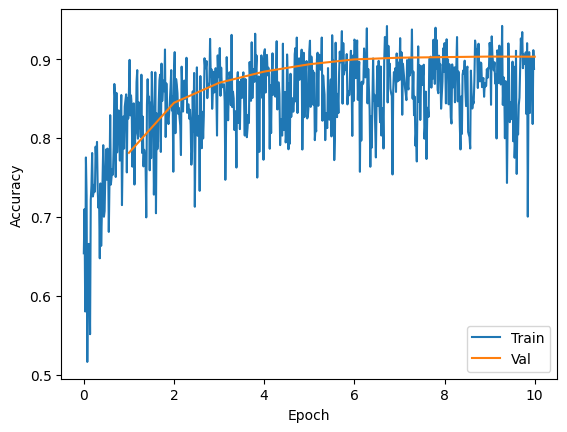

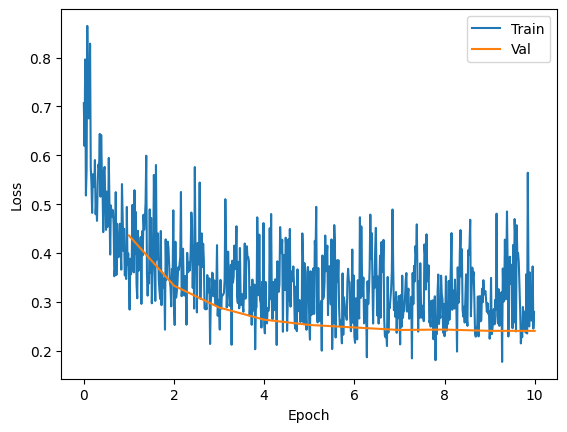

In [ ]:
# run training
bands = [0, 1, 2] #R/G/B
%load_ext autoreload
%autoreload 2

torch.manual_seed(seed)
train_loader, val_loader, test_loader = create_dataloaders(data_dir=DATA_PATH, batch_size=batch_size, bands=bands)



results = run_training(experiment_name=f"Deeplabv3+_RGB_lr_{learning_rate}_num_epochs_{max_epochs}",
                        model=model,
                        num_epochs=max_epochs,
                        optimizer=optimizer,
                        criterion=criterion,
                        train_dl=train_loader,
                        val_dl=val_loader,
                        scheduler=scheduler,
                        lr=learning_rate,
                        batch_size=batch_size,
                        device=device,
                        project_name=project_name
                        )

In [ ]:
result = evaluate(model, device, test_loader, criterion)
print(result)

(0.274838606797343, 0.8914967723507248, 0.7557516795663684, 0.8284083490347925, 0.896015754744429, 0.8608867510843244)


In [ ]:
result = evaluate(model, device, val_loader, criterion)
print(result)

(0.24085282935545996, 0.9033196459499352, 0.7040194901685983, 0.8037995961504993, 0.8501059040132151, 0.8263045044149602)


In [ ]:
loader = iter(test_loader)

Visualsing 16 examples


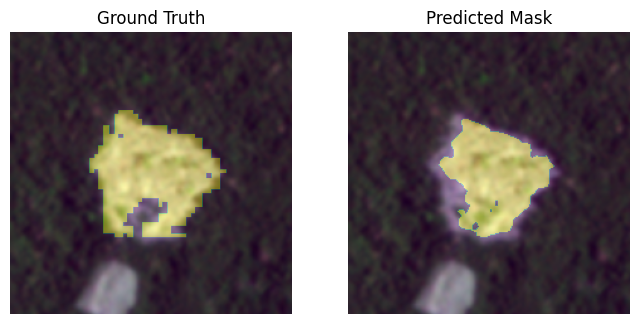

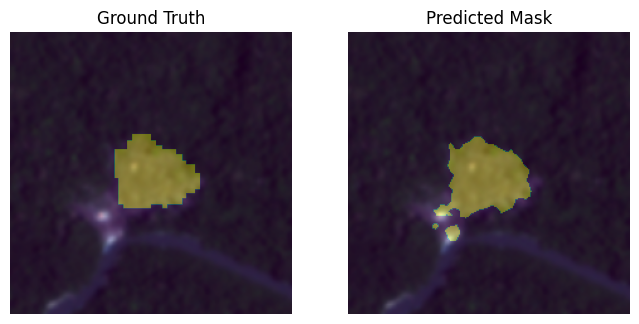

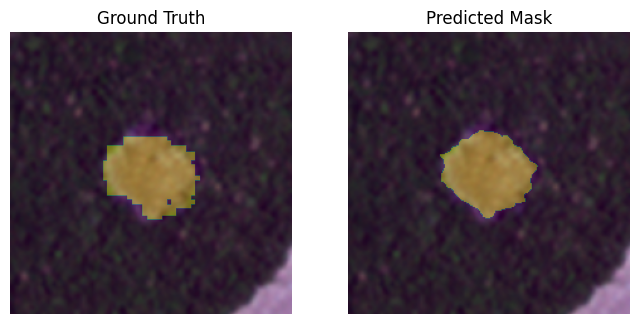

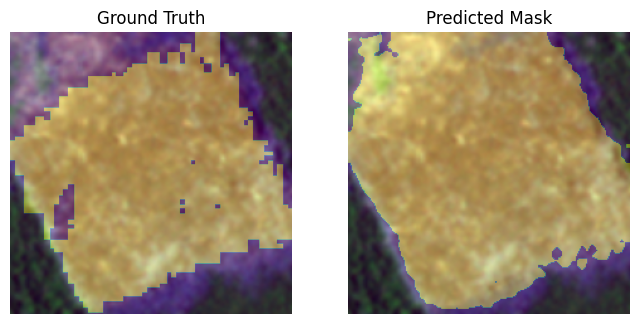

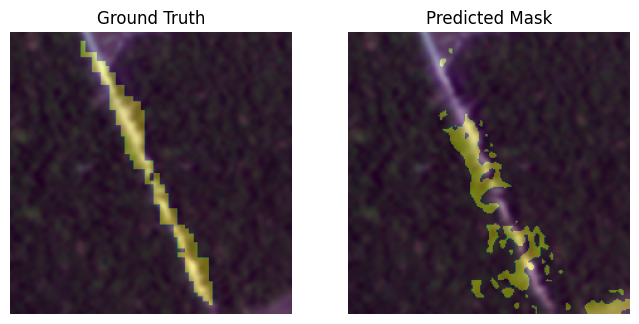

...

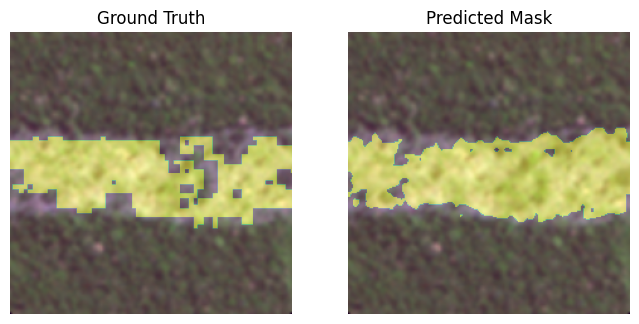

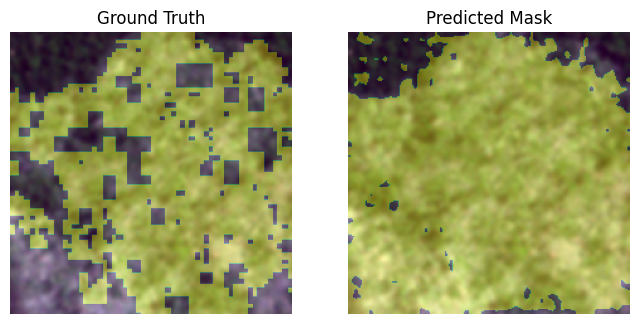

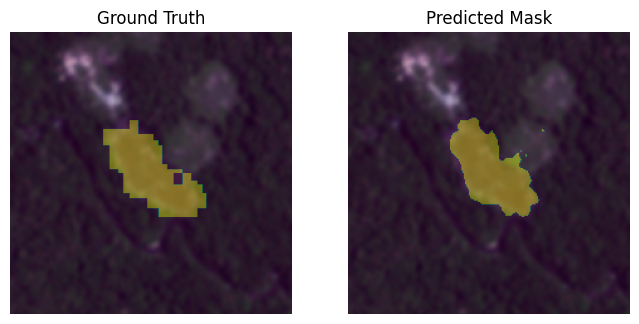

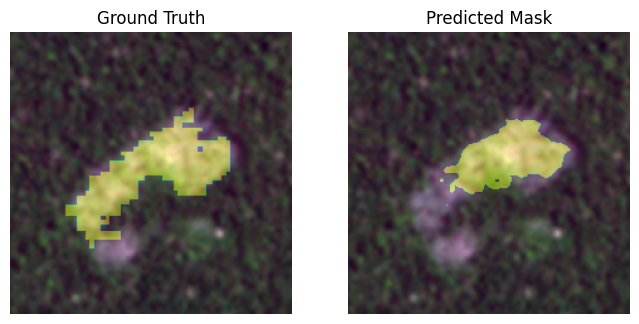

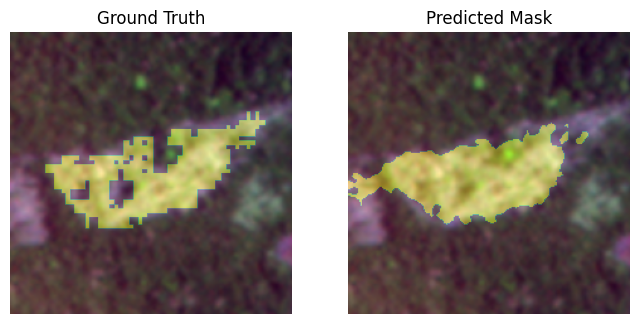

In [ ]:
batch_sample, batch_mask = next(loader)
batch_sample, batch_mask = batch_sample.to(device), batch_mask.to(device)
batch_output = model(batch_sample)
batch_predictions = batch_output.argmax(dim=1)
visualise_batch_predictions(batch_sample, batch_mask.unsqueeze(1), batch_predictions.unsqueeze(1), rescale=True, bands=bands)

### RGB reinitialized

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
%load_ext autoreload
%autoreload 2
model = fetch_deeplabv3(output_stride=8, num_classes=2,pretrained_backbone=False).to(device)
model.to(device)
optimizer = AdamW(model.parameters(),
                              lr=learning_rate,
                              weight_decay=1e-2)

scheduler = CosineAnnealingLR(optimizer, max_epochs)
criterion = torch.nn.CrossEntropyLoss()


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


wandb: Currently logged in as: jprado (ipeo_project). Use `wandb login --relogin` to force relogin


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 1-0 batch_loss=6.56e-01 batch_acc=0.635
Train Epoch: 1-6 batch_loss=6.05e-01 batch_acc=0.685
Train Epoch: 1-12 batch_loss=5.74e-01 batch_acc=0.738
Train Epoch: 1-18 batch_loss=6.53e-01 batch_acc=0.634
Train Epoch: 1-24 batch_loss=5.10e-01 batch_acc=0.759
Train Epoch: 1-30 batch_loss=7.09e-01 batch_acc=0.602
Train Epoch: 1-36 batch_loss=6.82e-01 batch_acc=0.614
Train Epoch: 1-42 batch_loss=4.84e-01 batch_acc=0.780
Train Epoch: 1-48 batch_loss=5.63e-01 batch_acc=0.728
Train Epoch: 1-54 batch_loss=4.78e-01 batch_acc=0.803
Train Epoch: 1-60 batch_loss=5.84e-01 batch_acc=0.686


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 2-0 batch_loss=4.88e-01 batch_acc=0.783
Train Epoch: 2-6 batch_loss=5.56e-01 batch_acc=0.718
Train Epoch: 2-12 batch_loss=4.42e-01 batch_acc=0.817
Train Epoch: 2-18 batch_loss=5.23e-01 batch_acc=0.757
Train Epoch: 2-24 batch_loss=5.06e-01 batch_acc=0.759
Train Epoch: 2-30 batch_loss=6.87e-01 batch_acc=0.604
Train Epoch: 2-36 batch_loss=5.92e-01 batch_acc=0.671
Train Epoch: 2-42 batch_loss=4.60e-01 batch_acc=0.793
Train Epoch: 2-48 batch_loss=4.18e-01 batch_acc=0.824
Train Epoch: 2-54 batch_loss=4.38e-01 batch_acc=0.821
Train Epoch: 2-60 batch_loss=5.25e-01 batch_acc=0.728


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 3-0 batch_loss=4.45e-01 batch_acc=0.807
Train Epoch: 3-6 batch_loss=4.93e-01 batch_acc=0.754
Train Epoch: 3-12 batch_loss=4.70e-01 batch_acc=0.780
Train Epoch: 3-18 batch_loss=4.39e-01 batch_acc=0.813
Train Epoch: 3-24 batch_loss=5.00e-01 batch_acc=0.756
Train Epoch: 3-30 batch_loss=6.89e-01 batch_acc=0.628
Train Epoch: 3-36 batch_loss=4.54e-01 batch_acc=0.769
Train Epoch: 3-42 batch_loss=5.59e-01 batch_acc=0.720
Train Epoch: 3-48 batch_loss=4.23e-01 batch_acc=0.814
Train Epoch: 3-54 batch_loss=3.72e-01 batch_acc=0.853
Train Epoch: 3-60 batch_loss=4.20e-01 batch_acc=0.801


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 4-0 batch_loss=3.83e-01 batch_acc=0.837
Train Epoch: 4-6 batch_loss=3.72e-01 batch_acc=0.837
Train Epoch: 4-12 batch_loss=4.48e-01 batch_acc=0.795
Train Epoch: 4-18 batch_loss=3.65e-01 batch_acc=0.865
Train Epoch: 4-24 batch_loss=5.06e-01 batch_acc=0.745
Train Epoch: 4-30 batch_loss=6.25e-01 batch_acc=0.655
Train Epoch: 4-36 batch_loss=4.93e-01 batch_acc=0.734
Train Epoch: 4-42 batch_loss=5.09e-01 batch_acc=0.751
Train Epoch: 4-48 batch_loss=4.73e-01 batch_acc=0.772
Train Epoch: 4-54 batch_loss=3.44e-01 batch_acc=0.869
Train Epoch: 4-60 batch_loss=5.10e-01 batch_acc=0.725


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 5-0 batch_loss=3.38e-01 batch_acc=0.871
Train Epoch: 5-6 batch_loss=3.70e-01 batch_acc=0.836
Train Epoch: 5-12 batch_loss=3.34e-01 batch_acc=0.867
Train Epoch: 5-18 batch_loss=3.96e-01 batch_acc=0.830
Train Epoch: 5-24 batch_loss=4.62e-01 batch_acc=0.778
Train Epoch: 5-30 batch_loss=4.83e-01 batch_acc=0.752
Train Epoch: 5-36 batch_loss=4.56e-01 batch_acc=0.762
Train Epoch: 5-42 batch_loss=5.06e-01 batch_acc=0.756
Train Epoch: 5-48 batch_loss=4.63e-01 batch_acc=0.777
Train Epoch: 5-54 batch_loss=3.73e-01 batch_acc=0.858
Train Epoch: 5-60 batch_loss=4.55e-01 batch_acc=0.769


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 6-0 batch_loss=3.38e-01 batch_acc=0.863
Train Epoch: 6-6 batch_loss=4.83e-01 batch_acc=0.773
Train Epoch: 6-12 batch_loss=3.18e-01 batch_acc=0.875
Train Epoch: 6-18 batch_loss=3.44e-01 batch_acc=0.864
Train Epoch: 6-24 batch_loss=5.08e-01 batch_acc=0.739
Train Epoch: 6-30 batch_loss=4.81e-01 batch_acc=0.763
Train Epoch: 6-36 batch_loss=5.90e-01 batch_acc=0.674
Train Epoch: 6-42 batch_loss=4.65e-01 batch_acc=0.775
Train Epoch: 6-48 batch_loss=4.92e-01 batch_acc=0.763
Train Epoch: 6-54 batch_loss=3.44e-01 batch_acc=0.873
Train Epoch: 6-60 batch_loss=3.84e-01 batch_acc=0.815


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 7-0 batch_loss=3.02e-01 batch_acc=0.892
Train Epoch: 7-6 batch_loss=3.71e-01 batch_acc=0.839
Train Epoch: 7-12 batch_loss=3.94e-01 batch_acc=0.818
Train Epoch: 7-18 batch_loss=3.06e-01 batch_acc=0.897
Train Epoch: 7-24 batch_loss=5.76e-01 batch_acc=0.701
Train Epoch: 7-30 batch_loss=5.33e-01 batch_acc=0.721
Train Epoch: 7-36 batch_loss=4.19e-01 batch_acc=0.788
Train Epoch: 7-42 batch_loss=6.35e-01 batch_acc=0.682
Train Epoch: 7-48 batch_loss=4.55e-01 batch_acc=0.787
Train Epoch: 7-54 batch_loss=4.77e-01 batch_acc=0.802
Train Epoch: 7-60 batch_loss=4.49e-01 batch_acc=0.767


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 8-0 batch_loss=3.80e-01 batch_acc=0.832
Train Epoch: 8-6 batch_loss=3.51e-01 batch_acc=0.846
Train Epoch: 8-12 batch_loss=4.29e-01 batch_acc=0.794
Train Epoch: 8-18 batch_loss=2.80e-01 batch_acc=0.907
Train Epoch: 8-24 batch_loss=5.84e-01 batch_acc=0.694
Train Epoch: 8-30 batch_loss=4.71e-01 batch_acc=0.757
Train Epoch: 8-36 batch_loss=5.25e-01 batch_acc=0.722
Train Epoch: 8-42 batch_loss=5.08e-01 batch_acc=0.739
Train Epoch: 8-48 batch_loss=3.63e-01 batch_acc=0.844
Train Epoch: 8-54 batch_loss=3.68e-01 batch_acc=0.851
Train Epoch: 8-60 batch_loss=5.02e-01 batch_acc=0.746


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 9-0 batch_loss=3.00e-01 batch_acc=0.889
Train Epoch: 9-6 batch_loss=4.20e-01 batch_acc=0.807
Train Epoch: 9-12 batch_loss=4.11e-01 batch_acc=0.808
Train Epoch: 9-18 batch_loss=3.33e-01 batch_acc=0.876
Train Epoch: 9-24 batch_loss=4.61e-01 batch_acc=0.769
Train Epoch: 9-30 batch_loss=4.38e-01 batch_acc=0.788
Train Epoch: 9-36 batch_loss=5.82e-01 batch_acc=0.673
Train Epoch: 9-42 batch_loss=4.36e-01 batch_acc=0.790
Train Epoch: 9-48 batch_loss=4.52e-01 batch_acc=0.785
Train Epoch: 9-54 batch_loss=4.29e-01 batch_acc=0.803
Train Epoch: 9-60 batch_loss=4.47e-01 batch_acc=0.778


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 10-0 batch_loss=2.96e-01 batch_acc=0.893
Train Epoch: 10-6 batch_loss=3.48e-01 batch_acc=0.844
Train Epoch: 10-12 batch_loss=3.09e-01 batch_acc=0.875
Train Epoch: 10-18 batch_loss=2.82e-01 batch_acc=0.905
Train Epoch: 10-24 batch_loss=4.56e-01 batch_acc=0.767
Train Epoch: 10-30 batch_loss=5.04e-01 batch_acc=0.744
Train Epoch: 10-36 batch_loss=4.98e-01 batch_acc=0.743
Train Epoch: 10-42 batch_loss=4.37e-01 batch_acc=0.782
Train Epoch: 10-48 batch_loss=3.73e-01 batch_acc=0.840
Train Epoch: 10-54 batch_loss=3.40e-01 batch_acc=0.864
Train Epoch: 10-60 batch_loss=3.83e-01 batch_acc=0.814


accuracy,▂▁▂▁▄▅▇▆▆▆▄▆▅▆▄▇█▆▂▆▅▃▅▇▅▄▆▆▆▃▆▇▇▄▄▅▇▃█▃
f1,▁▁▃▄▇█████
iou,▁▁▂▃▇▇████
learning rate,█▇▇▆▅▃▂▂▁▁
loss,█▇▇█▅▅▃▃▃▃▅▃▄▄▄▂▁▃▇▃▄▆▄▂▄█▃▃▃▆▃▃▂▅▄▄▂▆▁▆
precision,▁▁▃▃▆▇▇███
recall,██▂█▄▃▃▂▁▁
validation_accuracy,▂▁▄▄▇█████
validation_loss,▇█▆▆▃▂▁▁▁▁
accuracy,0.79824
f1,0.72268


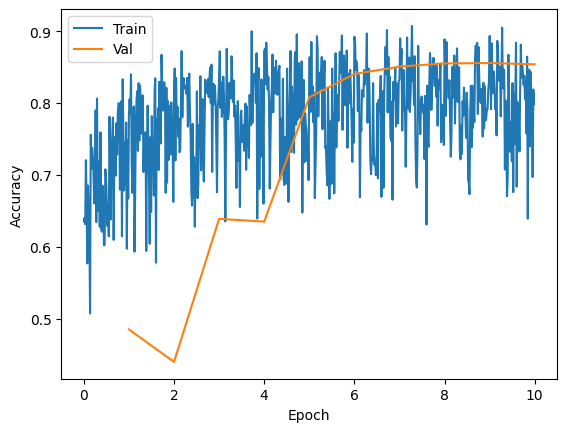

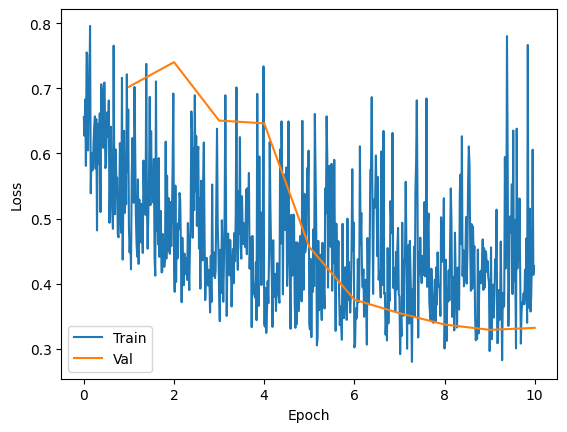

In [ ]:
# run training
bands = [0, 1, 2] #R/G/B
%load_ext autoreload
%autoreload 2

torch.manual_seed(seed)
train_loader, val_loader, test_loader = create_dataloaders(data_dir=DATA_PATH, batch_size=batch_size, bands=bands)



results = run_training(experiment_name=f"Deeplabv3+_RGB_reinitialized_lr_{learning_rate}_num_epochs_{max_epochs}",
                        model=model,
                        num_epochs=max_epochs,
                        optimizer=optimizer,
                        criterion=criterion,
                        train_dl=train_loader,
                        val_dl=val_loader,
                        scheduler=scheduler,
                        lr=learning_rate,
                        batch_size=batch_size,
                        device=device,
                        project_name=project_name
                        )

In [ ]:
result = evaluate(model, device, test_loader, criterion)
print(result)

(0.38886312229473263, 0.8317304008617581, 0.6385944941456415, 0.7658481662647569, 0.7935266539812756, 0.7794417672306447)


In [ ]:
result = evaluate(model, device, val_loader, criterion)
print(result)

(0.33201746268814625, 0.8538600980735104, 0.565783068391164, 0.7424719610404394, 0.7039231301461268, 0.7226838504167808)


In [ ]:
loader = iter(test_loader)

Visualsing 16 examples


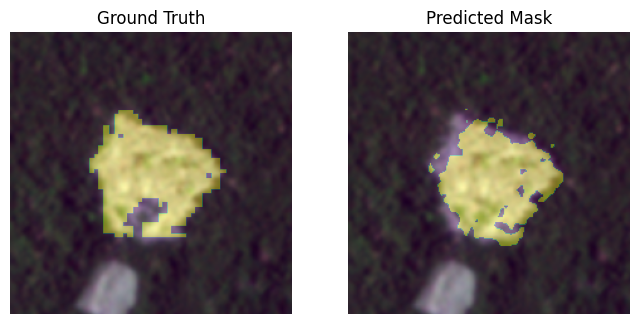

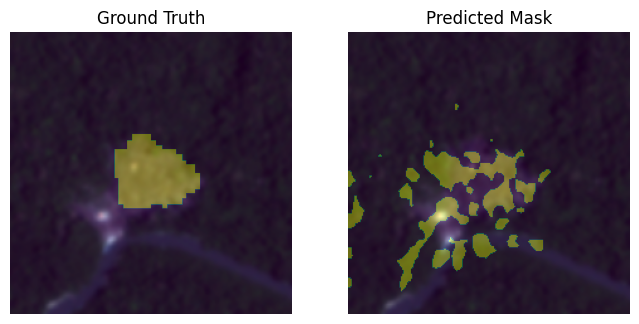

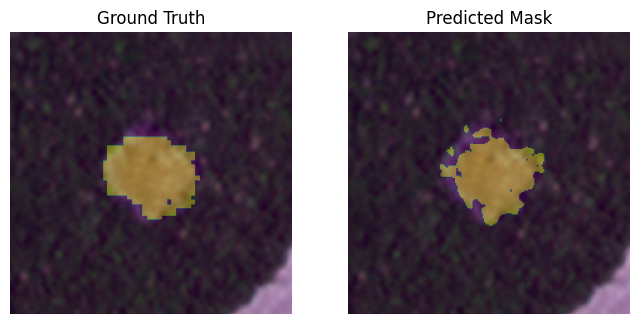

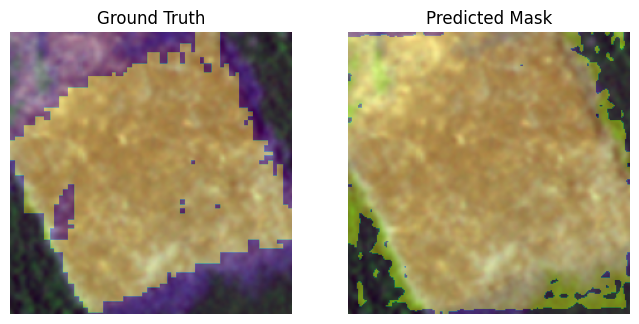

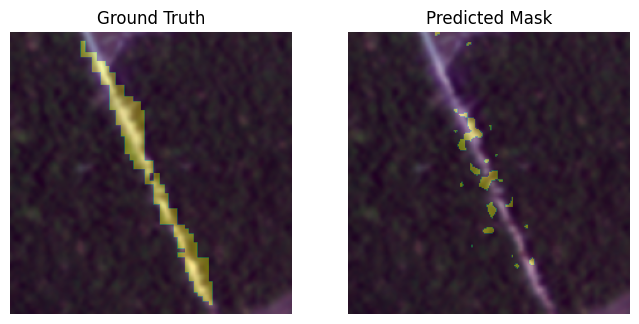

...

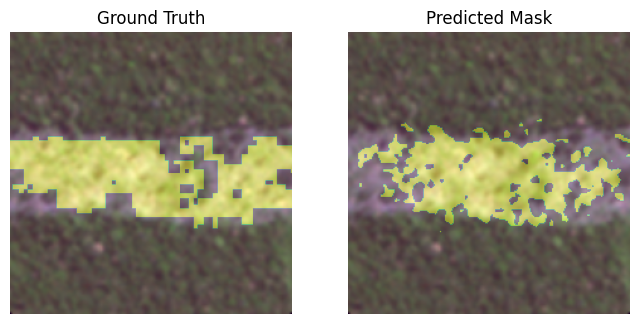

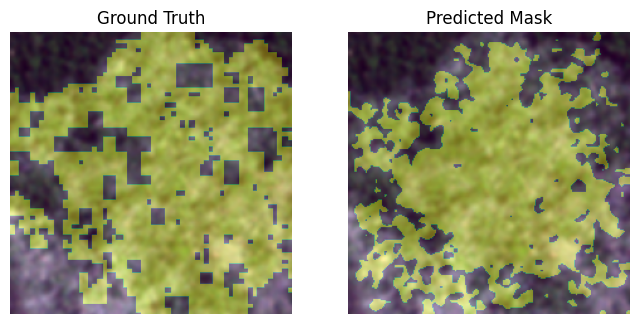

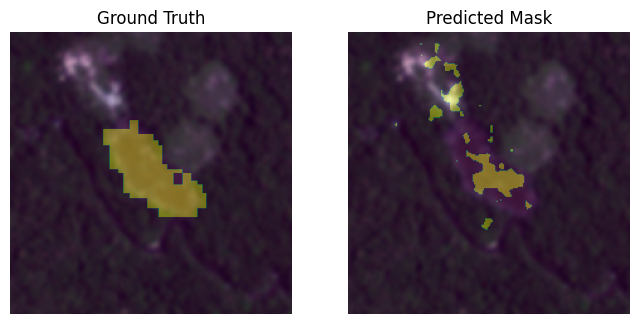

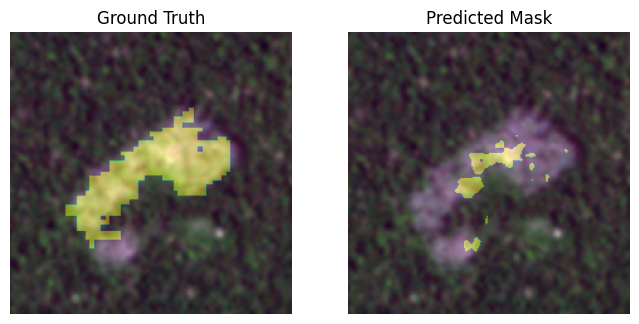

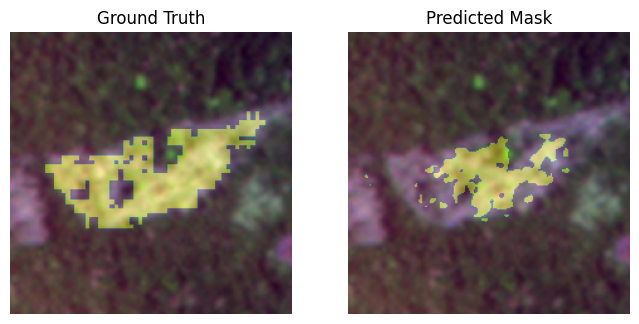

In [ ]:
batch_sample, batch_mask = next(loader)
batch_sample, batch_mask = batch_sample.to(device), batch_mask.to(device)
batch_output = model(batch_sample)
batch_predictions = batch_output.argmax(dim=1)
visualise_batch_predictions(batch_sample, batch_mask.unsqueeze(1), batch_predictions.unsqueeze(1), rescale=True, bands=bands)

### RGNIR Pretrained

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = fetch_deeplabv3(output_stride=8, num_classes=2,reset_blue_init=True).to(device)
model.to(device)
optimizer = AdamW(model.parameters(),
                              lr=learning_rate,
                              weight_decay=1e-2)

scheduler = CosineAnnealingLR(optimizer, max_epochs)
criterion = torch.nn.CrossEntropyLoss()




The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 1-0 batch_loss=7.65e-01 batch_acc=0.537
Train Epoch: 1-6 batch_loss=6.75e-01 batch_acc=0.622
Train Epoch: 1-12 batch_loss=6.04e-01 batch_acc=0.676
Train Epoch: 1-18 batch_loss=4.85e-01 batch_acc=0.784
Train Epoch: 1-24 batch_loss=6.48e-01 batch_acc=0.661
Train Epoch: 1-30 batch_loss=5.10e-01 batch_acc=0.752
Train Epoch: 1-36 batch_loss=5.58e-01 batch_acc=0.724
Train Epoch: 1-42 batch_loss=6.37e-01 batch_acc=0.663
Train Epoch: 1-48 batch_loss=4.53e-01 batch_acc=0.805
Train Epoch: 1-54 batch_loss=5.43e-01 batch_acc=0.725
Train Epoch: 1-60 batch_loss=3.96e-01 batch_acc=0.834


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 2-0 batch_loss=4.76e-01 batch_acc=0.791
Train Epoch: 2-6 batch_loss=4.06e-01 batch_acc=0.831
Train Epoch: 2-12 batch_loss=4.26e-01 batch_acc=0.838
Train Epoch: 2-18 batch_loss=3.33e-01 batch_acc=0.866
Train Epoch: 2-24 batch_loss=5.84e-01 batch_acc=0.782
Train Epoch: 2-30 batch_loss=5.01e-01 batch_acc=0.777
Train Epoch: 2-36 batch_loss=5.60e-01 batch_acc=0.722
Train Epoch: 2-42 batch_loss=5.85e-01 batch_acc=0.732
Train Epoch: 2-48 batch_loss=4.59e-01 batch_acc=0.808
Train Epoch: 2-54 batch_loss=3.95e-01 batch_acc=0.850
Train Epoch: 2-60 batch_loss=3.74e-01 batch_acc=0.841


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 3-0 batch_loss=3.87e-01 batch_acc=0.851
Train Epoch: 3-6 batch_loss=4.67e-01 batch_acc=0.812
Train Epoch: 3-12 batch_loss=3.64e-01 batch_acc=0.853
Train Epoch: 3-18 batch_loss=2.58e-01 batch_acc=0.909
Train Epoch: 3-24 batch_loss=5.36e-01 batch_acc=0.790
Train Epoch: 3-30 batch_loss=4.67e-01 batch_acc=0.772
Train Epoch: 3-36 batch_loss=4.01e-01 batch_acc=0.828
Train Epoch: 3-42 batch_loss=4.67e-01 batch_acc=0.794
Train Epoch: 3-48 batch_loss=4.28e-01 batch_acc=0.831
Train Epoch: 3-54 batch_loss=3.81e-01 batch_acc=0.869
Train Epoch: 3-60 batch_loss=3.45e-01 batch_acc=0.866


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 4-0 batch_loss=3.25e-01 batch_acc=0.879
Train Epoch: 4-6 batch_loss=3.59e-01 batch_acc=0.871
Train Epoch: 4-12 batch_loss=3.62e-01 batch_acc=0.873
Train Epoch: 4-18 batch_loss=2.51e-01 batch_acc=0.919
Train Epoch: 4-24 batch_loss=4.80e-01 batch_acc=0.830
Train Epoch: 4-30 batch_loss=4.51e-01 batch_acc=0.796
Train Epoch: 4-36 batch_loss=3.26e-01 batch_acc=0.868
Train Epoch: 4-42 batch_loss=4.14e-01 batch_acc=0.826
Train Epoch: 4-48 batch_loss=3.94e-01 batch_acc=0.836
Train Epoch: 4-54 batch_loss=3.79e-01 batch_acc=0.877
Train Epoch: 4-60 batch_loss=3.45e-01 batch_acc=0.857


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 5-0 batch_loss=3.53e-01 batch_acc=0.878
Train Epoch: 5-6 batch_loss=3.28e-01 batch_acc=0.883
Train Epoch: 5-12 batch_loss=3.31e-01 batch_acc=0.890
Train Epoch: 5-18 batch_loss=2.45e-01 batch_acc=0.910
Train Epoch: 5-24 batch_loss=4.58e-01 batch_acc=0.825
Train Epoch: 5-30 batch_loss=3.15e-01 batch_acc=0.872
Train Epoch: 5-36 batch_loss=3.02e-01 batch_acc=0.874
Train Epoch: 5-42 batch_loss=4.19e-01 batch_acc=0.821
Train Epoch: 5-48 batch_loss=3.65e-01 batch_acc=0.856
Train Epoch: 5-54 batch_loss=3.18e-01 batch_acc=0.900
Train Epoch: 5-60 batch_loss=2.88e-01 batch_acc=0.891


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 6-0 batch_loss=3.07e-01 batch_acc=0.895
Train Epoch: 6-6 batch_loss=3.61e-01 batch_acc=0.858
Train Epoch: 6-12 batch_loss=3.38e-01 batch_acc=0.892
Train Epoch: 6-18 batch_loss=2.26e-01 batch_acc=0.922
Train Epoch: 6-24 batch_loss=4.08e-01 batch_acc=0.838
Train Epoch: 6-30 batch_loss=3.26e-01 batch_acc=0.865
Train Epoch: 6-36 batch_loss=3.90e-01 batch_acc=0.824
Train Epoch: 6-42 batch_loss=4.49e-01 batch_acc=0.812
Train Epoch: 6-48 batch_loss=3.84e-01 batch_acc=0.842
Train Epoch: 6-54 batch_loss=3.19e-01 batch_acc=0.896
Train Epoch: 6-60 batch_loss=2.67e-01 batch_acc=0.916


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 7-0 batch_loss=2.86e-01 batch_acc=0.914
Train Epoch: 7-6 batch_loss=2.99e-01 batch_acc=0.890
Train Epoch: 7-12 batch_loss=3.38e-01 batch_acc=0.864
Train Epoch: 7-18 batch_loss=2.09e-01 batch_acc=0.942
Train Epoch: 7-24 batch_loss=4.35e-01 batch_acc=0.828
Train Epoch: 7-30 batch_loss=4.07e-01 batch_acc=0.820
Train Epoch: 7-36 batch_loss=3.25e-01 batch_acc=0.862
Train Epoch: 7-42 batch_loss=4.32e-01 batch_acc=0.799
Train Epoch: 7-48 batch_loss=3.59e-01 batch_acc=0.847
Train Epoch: 7-54 batch_loss=3.99e-01 batch_acc=0.857
Train Epoch: 7-60 batch_loss=3.05e-01 batch_acc=0.872


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 8-0 batch_loss=3.03e-01 batch_acc=0.880
Train Epoch: 8-6 batch_loss=3.25e-01 batch_acc=0.878
Train Epoch: 8-12 batch_loss=3.42e-01 batch_acc=0.857
Train Epoch: 8-18 batch_loss=2.26e-01 batch_acc=0.933
Train Epoch: 8-24 batch_loss=4.23e-01 batch_acc=0.819
Train Epoch: 8-30 batch_loss=3.50e-01 batch_acc=0.844
Train Epoch: 8-36 batch_loss=4.13e-01 batch_acc=0.815
Train Epoch: 8-42 batch_loss=3.75e-01 batch_acc=0.840
Train Epoch: 8-48 batch_loss=3.56e-01 batch_acc=0.869
Train Epoch: 8-54 batch_loss=2.75e-01 batch_acc=0.926
Train Epoch: 8-60 batch_loss=3.50e-01 batch_acc=0.854


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 9-0 batch_loss=2.75e-01 batch_acc=0.917
Train Epoch: 9-6 batch_loss=3.39e-01 batch_acc=0.864
Train Epoch: 9-12 batch_loss=3.26e-01 batch_acc=0.870
Train Epoch: 9-18 batch_loss=2.16e-01 batch_acc=0.925
Train Epoch: 9-24 batch_loss=4.16e-01 batch_acc=0.849
Train Epoch: 9-30 batch_loss=3.20e-01 batch_acc=0.863
Train Epoch: 9-36 batch_loss=4.02e-01 batch_acc=0.811
Train Epoch: 9-42 batch_loss=4.33e-01 batch_acc=0.841
Train Epoch: 9-48 batch_loss=3.35e-01 batch_acc=0.866
Train Epoch: 9-54 batch_loss=3.07e-01 batch_acc=0.878
Train Epoch: 9-60 batch_loss=3.09e-01 batch_acc=0.868


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 10-0 batch_loss=2.74e-01 batch_acc=0.917
Train Epoch: 10-6 batch_loss=3.35e-01 batch_acc=0.882
Train Epoch: 10-12 batch_loss=2.88e-01 batch_acc=0.905
Train Epoch: 10-18 batch_loss=2.11e-01 batch_acc=0.939
Train Epoch: 10-24 batch_loss=3.95e-01 batch_acc=0.844
Train Epoch: 10-30 batch_loss=3.48e-01 batch_acc=0.837
Train Epoch: 10-36 batch_loss=4.69e-01 batch_acc=0.785
Train Epoch: 10-42 batch_loss=4.44e-01 batch_acc=0.852
Train Epoch: 10-48 batch_loss=3.50e-01 batch_acc=0.867
Train Epoch: 10-54 batch_loss=3.07e-01 batch_acc=0.900
Train Epoch: 10-60 batch_loss=2.77e-01 batch_acc=0.906


accuracy,▁▄▃▅▆▅▆▆▆▅▄▆▇▆▇█▇▅▅▇▅▆▅▆▆▆▆▇▇▆▅▇▇▆▆▇▇▅█▆
f1,▁▄▆▇▇█████
iou,▁▄▆▇▇█████
learning rate,█▇▇▆▅▃▂▂▁▁
loss,█▅▆▄▄▅▃▃▄▄▆▃▃▃▂▁▃▅▄▃▇▄▄▃▂▃▃▂▂▄▄▃▂▃▃▂▃▅▁▃
precision,▂▁▅▇▇▇▇███
recall,▁█▇▇▇█████
validation_accuracy,▁▃▆▇▇█████
validation_loss,█▇▅▃▂▂▂▂▁▁
accuracy,0.85938
f1,0.8312


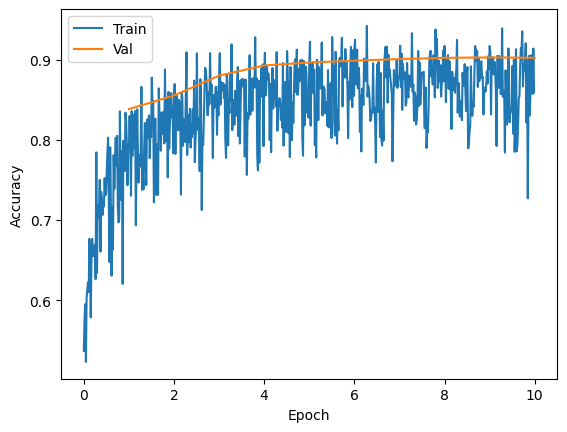

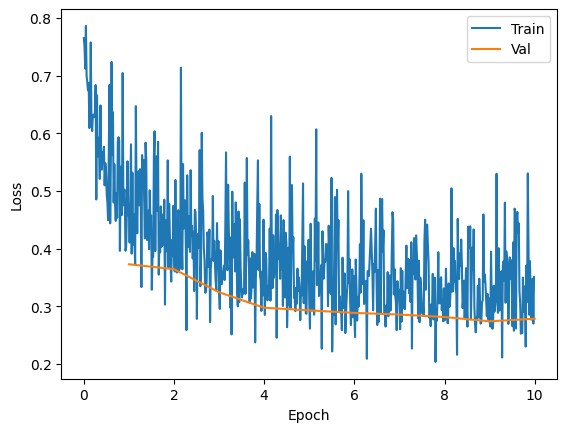

In [ ]:
# run training
bands = [0, 1, 3] #R/G/NIR
%load_ext autoreload
%autoreload 2

torch.manual_seed(seed)
train_loader, val_loader, test_loader = create_dataloaders(data_dir=DATA_PATH, batch_size=batch_size, bands=bands)



results = run_training(experiment_name=f"Deeplabv3+_RGNIR_lr_{learning_rate}_num_epochs_{max_epochs}",
                        model=model,
                        num_epochs=max_epochs,
                        optimizer=optimizer,
                        criterion=criterion,
                        train_dl=train_loader,
                        val_dl=val_loader,
                        scheduler=scheduler,
                        lr=learning_rate,
                        batch_size=batch_size,
                        device=device,
                        project_name=project_name
                        )

In [ ]:
result = evaluate(model, device, test_loader, criterion)
print(result)

(0.3211464901905599, 0.8862345885240138, 0.7496255108589839, 0.8104019893291878, 0.9090546176001155, 0.8568982404594148)


In [ ]:
result = evaluate(model, device, val_loader, criterion)
print(result)

(0.2782001836244079, 0.9024592631262371, 0.7111629339117836, 0.7813913110236451, 0.8878006363111302, 0.8312042293787164)


In [ ]:
loader = iter(test_loader)

Visualsing 16 examples


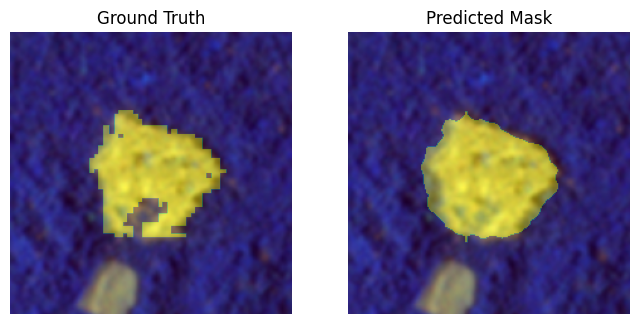

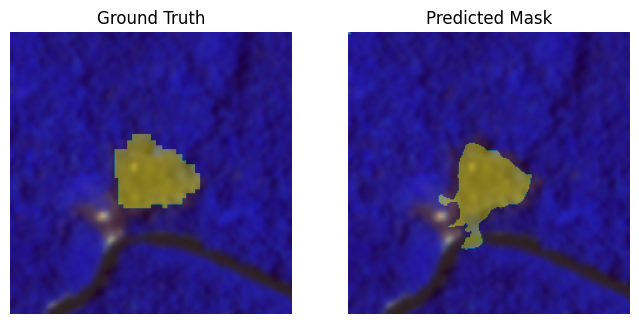

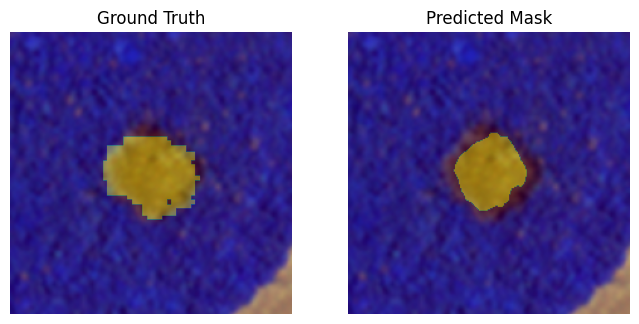

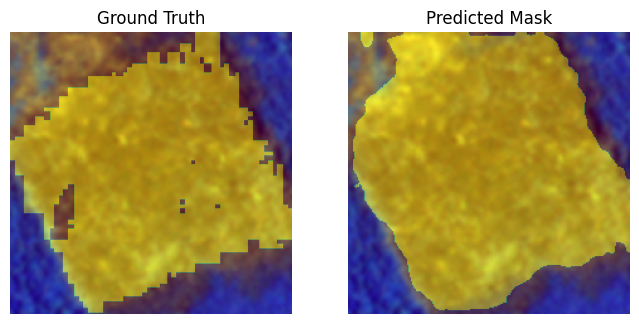

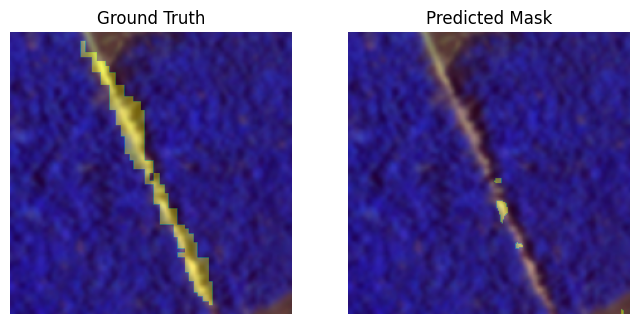

...

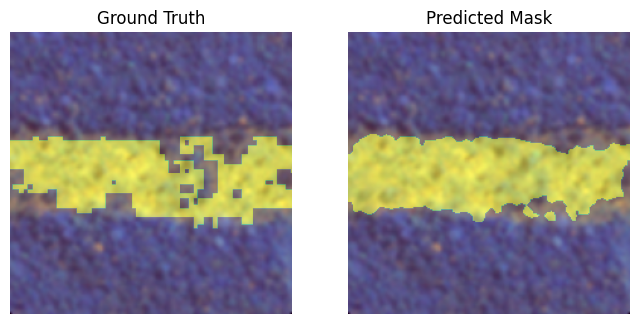

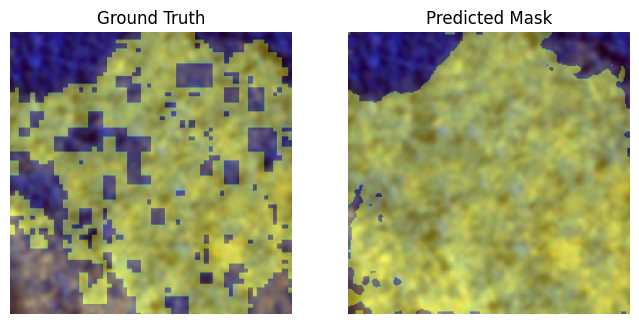

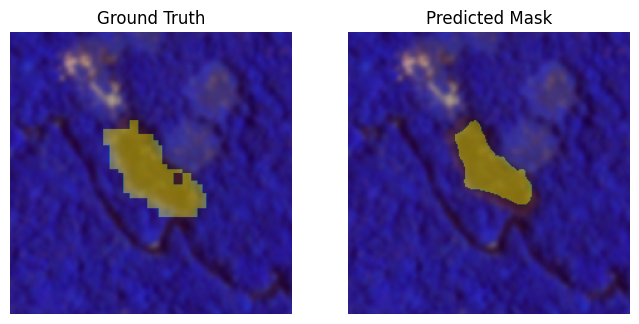

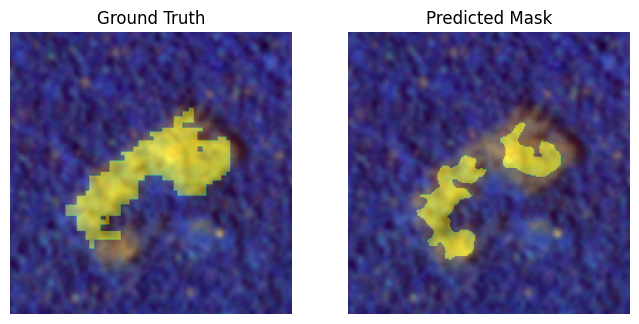

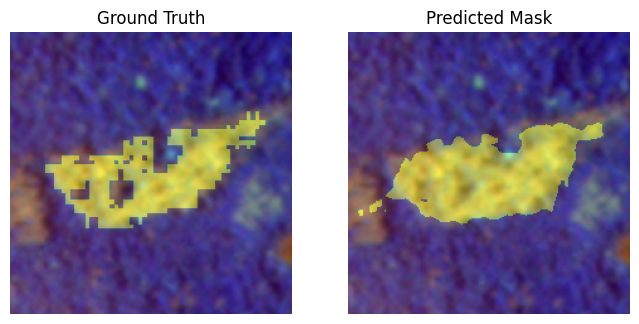

In [ ]:
batch_sample, batch_mask = next(loader)
batch_sample, batch_mask = batch_sample.to(device), batch_mask.to(device)
batch_output = model(batch_sample)
batch_predictions = batch_output.argmax(dim=1)
visualise_batch_predictions(batch_sample, batch_mask.unsqueeze(1), batch_predictions.unsqueeze(1), rescale=True, bands=bands)

### RGNIR reinitialized

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = fetch_deeplabv3(output_stride=8, num_classes=2,pretrained_backbone=False).to(device)
model.to(device)
optimizer = AdamW(model.parameters(),
                              lr=learning_rate,
                              weight_decay=1e-2)

scheduler = CosineAnnealingLR(optimizer, max_epochs)
criterion = torch.nn.CrossEntropyLoss()




In [ ]:
# run training
bands = [0, 1, 3] #R/G/NIR
%load_ext autoreload
%autoreload 2

torch.manual_seed(seed)
train_loader, val_loader, test_loader = create_dataloaders(data_dir=DATA_PATH, batch_size=batch_size, bands=bands)



results = run_training(experiment_name=f"Deeplabv3+_RGNIR_lr_{learning_rate}_num_epochs_{max_epochs}",
                        model=model,
                        num_epochs=max_epochs,
                        optimizer=optimizer,
                        criterion=criterion,
                        train_dl=train_loader,
                        val_dl=val_loader,
                        scheduler=scheduler,
                        lr=learning_rate,
                        batch_size=batch_size,
                        device=device,
                        project_name=project_name
                        )

In [ ]:
result = evaluate(model, device, test_loader, criterion)
print(result)

In [ ]:
result = evaluate(model, device, val_loader, criterion)
print(result)

In [ ]:
loader = iter(test_loader)

In [ ]:
batch_sample, batch_mask = next(loader)
batch_sample, batch_mask = batch_sample.to(device), batch_mask.to(device)
batch_output = model(batch_sample)
batch_predictions = batch_output.argmax(dim=1)
visualise_batch_predictions(batch_sample, batch_mask.unsqueeze(1), batch_predictions.unsqueeze(1), rescale=True, bands=bands)

### RGNDVI pretrained

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = fetch_deeplabv3(output_stride=8, num_classes=2,reset_blue_init=True).to(device)
model.to(device)
optimizer = AdamW(model.parameters(),
                              lr=learning_rate,
                              weight_decay=1e-2)

scheduler = CosineAnnealingLR(optimizer, max_epochs)
criterion = torch.nn.CrossEntropyLoss()




The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


accuracy,▅▃▆▆▅▁▃▅▅▅▂▃▃▅▂▅▅▃▃▄▃▇█▆▆▇▅▄▆▇▆▅▆▅▅▆▄▅▅▅
f1,▁
iou,▁
learning rate,▁
loss,▃▅▂▃▄█▆▃▅▅▆▆▅▄▆▃▃▆▅▄▅▂▁▃▃▂▄▅▂▂▂▄▃▄▃▃▄▃▄▄
precision,▁
recall,▁
validation_accuracy,▁
validation_loss,▁
accuracy,0.89229
f1,0.82174


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 1-0 batch_loss=9.41e-01 batch_acc=0.418
Train Epoch: 1-6 batch_loss=8.57e-01 batch_acc=0.493
Train Epoch: 1-12 batch_loss=7.01e-01 batch_acc=0.621
Train Epoch: 1-18 batch_loss=4.93e-01 batch_acc=0.782
Train Epoch: 1-24 batch_loss=8.41e-01 batch_acc=0.597
Train Epoch: 1-30 batch_loss=5.82e-01 batch_acc=0.719
Train Epoch: 1-36 batch_loss=5.82e-01 batch_acc=0.714
Train Epoch: 1-42 batch_loss=8.59e-01 batch_acc=0.609
Train Epoch: 1-48 batch_loss=5.62e-01 batch_acc=0.757
Train Epoch: 1-54 batch_loss=7.22e-01 batch_acc=0.673
Train Epoch: 1-60 batch_loss=5.05e-01 batch_acc=0.797


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 2-0 batch_loss=5.58e-01 batch_acc=0.764
Train Epoch: 2-6 batch_loss=4.70e-01 batch_acc=0.829
Train Epoch: 2-12 batch_loss=4.95e-01 batch_acc=0.833
Train Epoch: 2-18 batch_loss=3.71e-01 batch_acc=0.863
Train Epoch: 2-24 batch_loss=7.04e-01 batch_acc=0.739
Train Epoch: 2-30 batch_loss=5.49e-01 batch_acc=0.752
Train Epoch: 2-36 batch_loss=6.48e-01 batch_acc=0.717
Train Epoch: 2-42 batch_loss=7.53e-01 batch_acc=0.717
Train Epoch: 2-48 batch_loss=5.45e-01 batch_acc=0.815
Train Epoch: 2-54 batch_loss=4.59e-01 batch_acc=0.821
Train Epoch: 2-60 batch_loss=4.01e-01 batch_acc=0.844


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 3-0 batch_loss=4.45e-01 batch_acc=0.851
Train Epoch: 3-6 batch_loss=6.12e-01 batch_acc=0.800
Train Epoch: 3-12 batch_loss=4.14e-01 batch_acc=0.852
Train Epoch: 3-18 batch_loss=3.01e-01 batch_acc=0.905
Train Epoch: 3-24 batch_loss=6.37e-01 batch_acc=0.799
Train Epoch: 3-30 batch_loss=5.22e-01 batch_acc=0.760
Train Epoch: 3-36 batch_loss=4.07e-01 batch_acc=0.850
Train Epoch: 3-42 batch_loss=4.96e-01 batch_acc=0.793
Train Epoch: 3-48 batch_loss=4.79e-01 batch_acc=0.841
Train Epoch: 3-54 batch_loss=4.82e-01 batch_acc=0.863
Train Epoch: 3-60 batch_loss=3.80e-01 batch_acc=0.876


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 4-0 batch_loss=3.72e-01 batch_acc=0.881
Train Epoch: 4-6 batch_loss=4.33e-01 batch_acc=0.874
Train Epoch: 4-12 batch_loss=4.51e-01 batch_acc=0.862
Train Epoch: 4-18 batch_loss=2.53e-01 batch_acc=0.927
Train Epoch: 4-24 batch_loss=5.53e-01 batch_acc=0.818
Train Epoch: 4-30 batch_loss=4.11e-01 batch_acc=0.830
Train Epoch: 4-36 batch_loss=3.72e-01 batch_acc=0.857
Train Epoch: 4-42 batch_loss=4.76e-01 batch_acc=0.823
Train Epoch: 4-48 batch_loss=4.24e-01 batch_acc=0.835
Train Epoch: 4-54 batch_loss=4.83e-01 batch_acc=0.889
Train Epoch: 4-60 batch_loss=3.34e-01 batch_acc=0.867


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 5-0 batch_loss=3.52e-01 batch_acc=0.906
Train Epoch: 5-6 batch_loss=3.92e-01 batch_acc=0.883
Train Epoch: 5-12 batch_loss=3.45e-01 batch_acc=0.895
Train Epoch: 5-18 batch_loss=2.97e-01 batch_acc=0.893
Train Epoch: 5-24 batch_loss=5.85e-01 batch_acc=0.813
Train Epoch: 5-30 batch_loss=3.62e-01 batch_acc=0.859
Train Epoch: 5-36 batch_loss=3.46e-01 batch_acc=0.872
Train Epoch: 5-42 batch_loss=4.69e-01 batch_acc=0.827
Train Epoch: 5-48 batch_loss=4.12e-01 batch_acc=0.837
Train Epoch: 5-54 batch_loss=3.52e-01 batch_acc=0.914
Train Epoch: 5-60 batch_loss=3.12e-01 batch_acc=0.881


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 6-0 batch_loss=3.49e-01 batch_acc=0.899
Train Epoch: 6-6 batch_loss=4.47e-01 batch_acc=0.852
Train Epoch: 6-12 batch_loss=3.37e-01 batch_acc=0.898
Train Epoch: 6-18 batch_loss=2.40e-01 batch_acc=0.926
Train Epoch: 6-24 batch_loss=5.35e-01 batch_acc=0.833
Train Epoch: 6-30 batch_loss=3.20e-01 batch_acc=0.877
Train Epoch: 6-36 batch_loss=4.25e-01 batch_acc=0.819
Train Epoch: 6-42 batch_loss=5.77e-01 batch_acc=0.804
Train Epoch: 6-48 batch_loss=4.13e-01 batch_acc=0.840
Train Epoch: 6-54 batch_loss=3.45e-01 batch_acc=0.905
Train Epoch: 6-60 batch_loss=2.98e-01 batch_acc=0.897


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 7-0 batch_loss=3.14e-01 batch_acc=0.921
Train Epoch: 7-6 batch_loss=3.38e-01 batch_acc=0.885
Train Epoch: 7-12 batch_loss=3.61e-01 batch_acc=0.856
Train Epoch: 7-18 batch_loss=2.08e-01 batch_acc=0.940
Train Epoch: 7-24 batch_loss=4.60e-01 batch_acc=0.837
Train Epoch: 7-30 batch_loss=3.95e-01 batch_acc=0.818
Train Epoch: 7-36 batch_loss=3.11e-01 batch_acc=0.878
Train Epoch: 7-42 batch_loss=4.06e-01 batch_acc=0.827
Train Epoch: 7-48 batch_loss=3.79e-01 batch_acc=0.859
Train Epoch: 7-54 batch_loss=4.15e-01 batch_acc=0.859
Train Epoch: 7-60 batch_loss=3.48e-01 batch_acc=0.855


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 8-0 batch_loss=3.17e-01 batch_acc=0.882
Train Epoch: 8-6 batch_loss=3.96e-01 batch_acc=0.884
Train Epoch: 8-12 batch_loss=3.52e-01 batch_acc=0.865
Train Epoch: 8-18 batch_loss=2.47e-01 batch_acc=0.927
Train Epoch: 8-24 batch_loss=4.82e-01 batch_acc=0.794
Train Epoch: 8-30 batch_loss=3.57e-01 batch_acc=0.840
Train Epoch: 8-36 batch_loss=3.95e-01 batch_acc=0.830
Train Epoch: 8-42 batch_loss=3.78e-01 batch_acc=0.848
Train Epoch: 8-48 batch_loss=4.00e-01 batch_acc=0.869
Train Epoch: 8-54 batch_loss=2.99e-01 batch_acc=0.922
Train Epoch: 8-60 batch_loss=3.87e-01 batch_acc=0.840


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 9-0 batch_loss=2.99e-01 batch_acc=0.919
Train Epoch: 9-6 batch_loss=3.98e-01 batch_acc=0.875
Train Epoch: 9-12 batch_loss=3.30e-01 batch_acc=0.869
Train Epoch: 9-18 batch_loss=2.21e-01 batch_acc=0.929
Train Epoch: 9-24 batch_loss=4.54e-01 batch_acc=0.846
Train Epoch: 9-30 batch_loss=3.13e-01 batch_acc=0.880
Train Epoch: 9-36 batch_loss=4.06e-01 batch_acc=0.832
Train Epoch: 9-42 batch_loss=5.28e-01 batch_acc=0.828
Train Epoch: 9-48 batch_loss=3.75e-01 batch_acc=0.853
Train Epoch: 9-54 batch_loss=3.40e-01 batch_acc=0.862
Train Epoch: 9-60 batch_loss=3.57e-01 batch_acc=0.852


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 10-0 batch_loss=2.79e-01 batch_acc=0.922
Train Epoch: 10-6 batch_loss=3.78e-01 batch_acc=0.882
Train Epoch: 10-12 batch_loss=2.89e-01 batch_acc=0.906
Train Epoch: 10-18 batch_loss=2.06e-01 batch_acc=0.942
Train Epoch: 10-24 batch_loss=4.79e-01 batch_acc=0.845
Train Epoch: 10-30 batch_loss=3.54e-01 batch_acc=0.837
Train Epoch: 10-36 batch_loss=4.17e-01 batch_acc=0.815
Train Epoch: 10-42 batch_loss=5.71e-01 batch_acc=0.825
Train Epoch: 10-48 batch_loss=3.83e-01 batch_acc=0.876
Train Epoch: 10-54 batch_loss=2.96e-01 batch_acc=0.912
Train Epoch: 10-60 batch_loss=3.04e-01 batch_acc=0.898


accuracy,▁▄▅▆▆▆▇▆▇▆▅▇▇▇▇██▆▆▇▆▆▆▇▇▆▆▇▇▆▆▇█▆▇▇▇▆█▇
f1,▁▅▇▇██████
iou,▁▅▆▇██████
learning rate,█▇▇▆▅▃▂▂▁▁
loss,█▆▅▄▄▅▃▄▃▄▆▃▂▃▃▁▃▅▃▂▆▃▅▃▂▃▄▂▂▄▄▃▂▄▂▂▃▄▁▃
precision,▁▄▆▇▇▇████
recall,▁█▇▃▄▆▃▂▃▂
validation_accuracy,▁▅▇▇██████
validation_loss,█▅▃▂▂▂▁▁▁▁
accuracy,0.86866
f1,0.83124


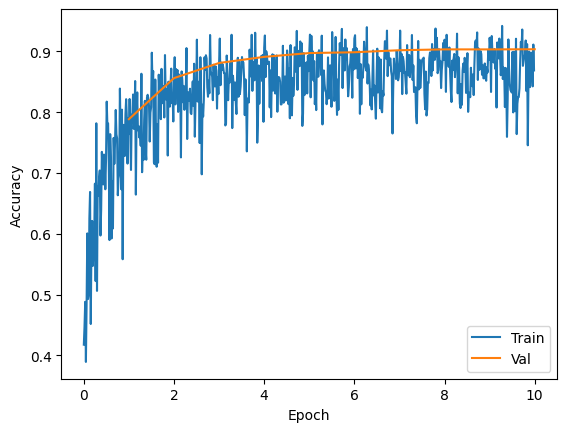

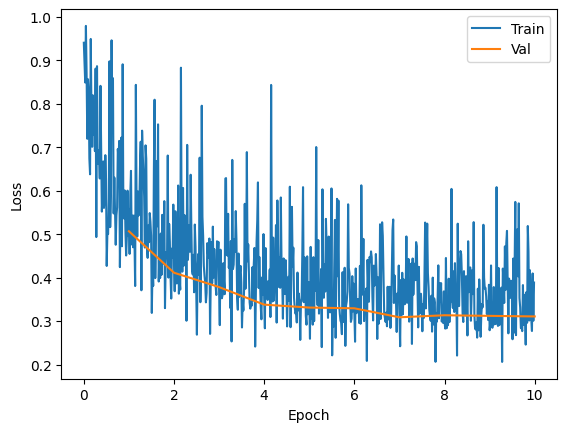

In [ ]:
# run training
bands = [0, 1, 4] #R/G/NDVI
%load_ext autoreload
%autoreload 2

torch.manual_seed(seed)
train_loader, val_loader, test_loader = create_dataloaders(data_dir=DATA_PATH, batch_size=batch_size, bands=bands)



results = run_training(experiment_name=f"Deeplabv3+_RGNDVI_lr_{learning_rate}_num_epochs_{max_epochs}",
                        model=model,
                        num_epochs=max_epochs,
                        optimizer=optimizer,
                        criterion=criterion,
                        train_dl=train_loader,
                        val_dl=val_loader,
                        scheduler=scheduler,
                        lr=learning_rate,
                        batch_size=batch_size,
                        device=device,
                        project_name=project_name
                        )

In [ ]:
result = evaluate(model, device, test_loader, criterion)
print(result)

(0.3961067336608159, 0.8871877704261917, 0.7500773055542987, 0.8153107655823709, 0.9036119533372076, 0.8571933401727395)


In [ ]:
result = evaluate(model, device, val_loader, criterion)
print(result)

(0.3107420398439452, 0.9035346750008532, 0.7112122980208356, 0.7890246394274673, 0.8782234441621214, 0.8312379461547978)


In [ ]:
loader = iter(test_loader)

Visualsing 16 examples


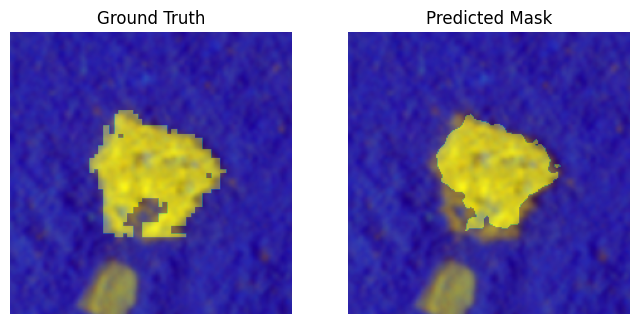

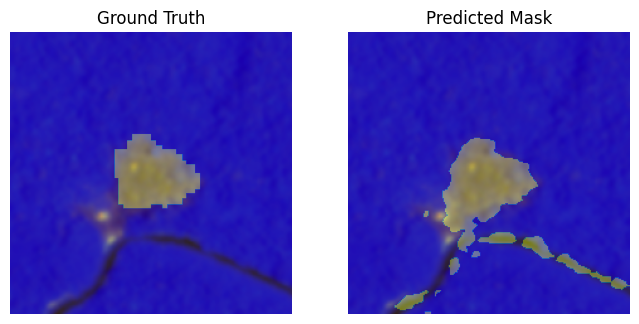

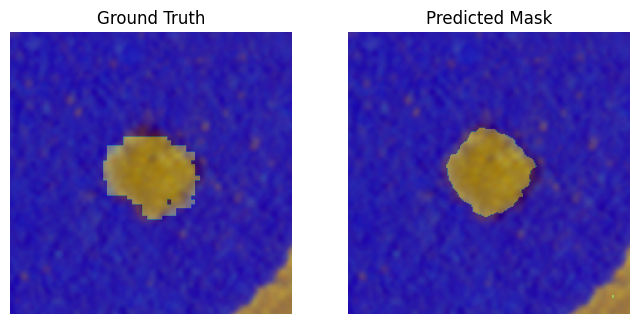

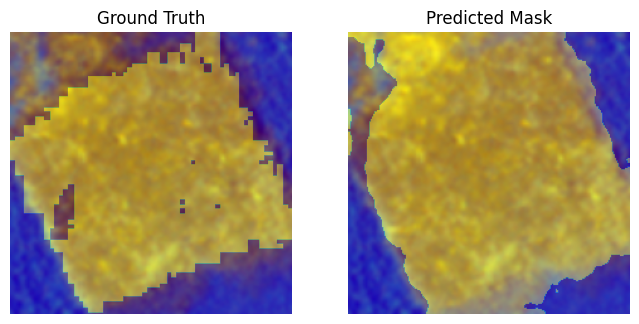

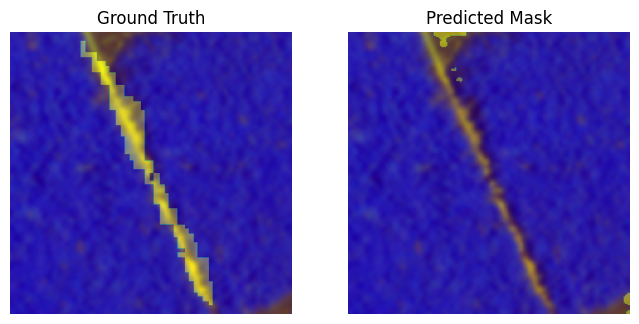

...

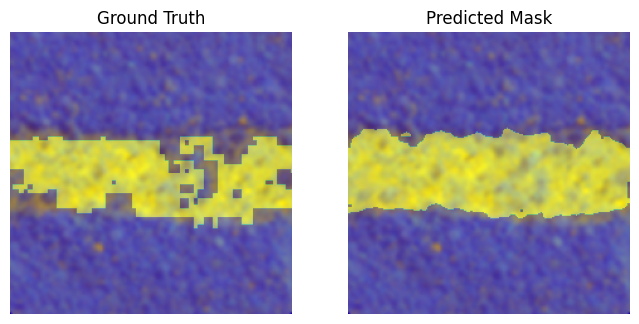

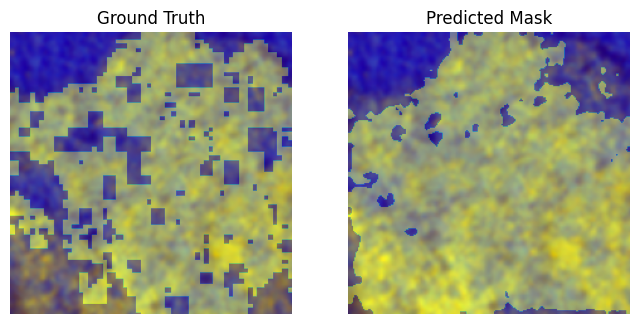

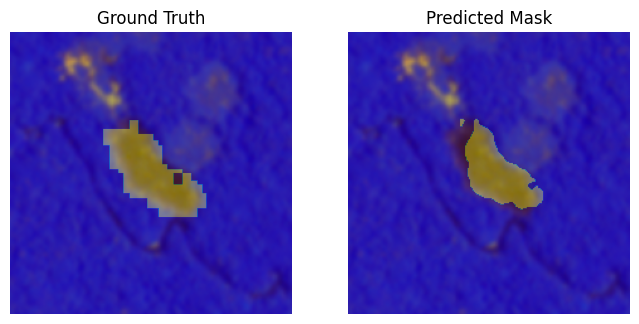

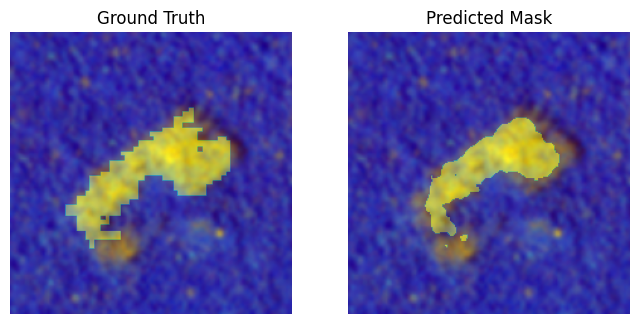

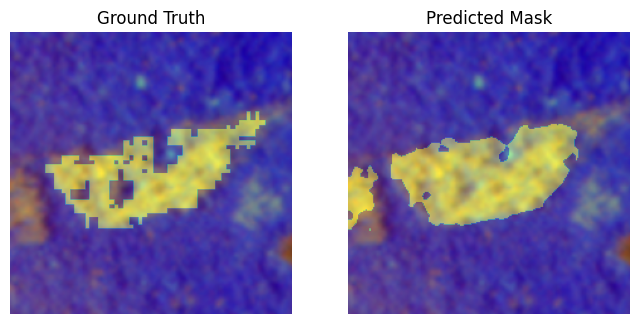

In [ ]:
batch_sample, batch_mask = next(loader)
batch_sample, batch_mask = batch_sample.to(device), batch_mask.to(device)
batch_output = model(batch_sample)
batch_predictions = batch_output.argmax(dim=1)
visualise_batch_predictions(batch_sample, batch_mask.unsqueeze(1), batch_predictions.unsqueeze(1), rescale=True, bands=bands)

### RGNDVI reinitialized

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = fetch_deeplabv3(output_stride=8, num_classes=2,pretrained_backbone=False).to(device)
model.to(device)
optimizer = AdamW(model.parameters(),
                              lr=learning_rate,
                              weight_decay=1e-2)

scheduler = CosineAnnealingLR(optimizer, max_epochs)
criterion = torch.nn.CrossEntropyLoss()




In [ ]:
!wandb init

Let's setup this directory for W&B!
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
Aborted!
Exception ignored in atexit callback: <bound method Sentry.end_session of <wandb.analytics.sentry.Sentry object at 0x7b72137fff70>>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/wandb/analytics/sentry.py", line 43, in wrapper
    return func(self, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/wandb/analytics/sentry.py", line 177, in end_session
    self.hub.end_session()
  File "/usr/local/lib/python3.10/dist-packages/sentry_sdk/hub.py", line 734, in end_session
    client.capture_session(session)
  File "/usr/local/lib/python3.10/dist-packages/sentry_sdk/client.py", line 662, in capture_session
    self.session_flusher.ad

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 1-0 batch_loss=7.25e-01 batch_acc=0.605
Train Epoch: 1-6 batch_loss=7.03e-01 batch_acc=0.639
Train Epoch: 1-12 batch_loss=6.07e-01 batch_acc=0.722
Train Epoch: 1-18 batch_loss=7.09e-01 batch_acc=0.607
Train Epoch: 1-24 batch_loss=5.52e-01 batch_acc=0.716
Train Epoch: 1-30 batch_loss=8.03e-01 batch_acc=0.530
Train Epoch: 1-36 batch_loss=7.48e-01 batch_acc=0.545
Train Epoch: 1-42 batch_loss=4.76e-01 batch_acc=0.799
Train Epoch: 1-48 batch_loss=5.92e-01 batch_acc=0.694
Train Epoch: 1-54 batch_loss=5.01e-01 batch_acc=0.786
Train Epoch: 1-60 batch_loss=6.65e-01 batch_acc=0.641


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 2-0 batch_loss=5.24e-01 batch_acc=0.757
Train Epoch: 2-6 batch_loss=6.28e-01 batch_acc=0.657
Train Epoch: 2-12 batch_loss=4.27e-01 batch_acc=0.824
Train Epoch: 2-18 batch_loss=5.31e-01 batch_acc=0.741
Train Epoch: 2-24 batch_loss=5.04e-01 batch_acc=0.756
Train Epoch: 2-30 batch_loss=7.97e-01 batch_acc=0.544
Train Epoch: 2-36 batch_loss=6.90e-01 batch_acc=0.601
Train Epoch: 2-42 batch_loss=4.30e-01 batch_acc=0.831
Train Epoch: 2-48 batch_loss=4.33e-01 batch_acc=0.814
Train Epoch: 2-54 batch_loss=4.61e-01 batch_acc=0.809
Train Epoch: 2-60 batch_loss=5.69e-01 batch_acc=0.711


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 3-0 batch_loss=4.65e-01 batch_acc=0.798
Train Epoch: 3-6 batch_loss=5.35e-01 batch_acc=0.726
Train Epoch: 3-12 batch_loss=4.57e-01 batch_acc=0.789
Train Epoch: 3-18 batch_loss=4.70e-01 batch_acc=0.789
Train Epoch: 3-24 batch_loss=5.16e-01 batch_acc=0.752
Train Epoch: 3-30 batch_loss=7.31e-01 batch_acc=0.583
Train Epoch: 3-36 batch_loss=4.87e-01 batch_acc=0.742
Train Epoch: 3-42 batch_loss=5.01e-01 batch_acc=0.750
Train Epoch: 3-48 batch_loss=4.25e-01 batch_acc=0.809
Train Epoch: 3-54 batch_loss=4.21e-01 batch_acc=0.815
Train Epoch: 3-60 batch_loss=4.39e-01 batch_acc=0.796


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 4-0 batch_loss=4.11e-01 batch_acc=0.815
Train Epoch: 4-6 batch_loss=3.91e-01 batch_acc=0.825
Train Epoch: 4-12 batch_loss=4.57e-01 batch_acc=0.790
Train Epoch: 4-18 batch_loss=3.65e-01 batch_acc=0.866
Train Epoch: 4-24 batch_loss=4.63e-01 batch_acc=0.780
Train Epoch: 4-30 batch_loss=6.38e-01 batch_acc=0.653
Train Epoch: 4-36 batch_loss=4.87e-01 batch_acc=0.735
Train Epoch: 4-42 batch_loss=4.54e-01 batch_acc=0.784
Train Epoch: 4-48 batch_loss=4.88e-01 batch_acc=0.761
Train Epoch: 4-54 batch_loss=3.86e-01 batch_acc=0.846
Train Epoch: 4-60 batch_loss=5.47e-01 batch_acc=0.719


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 5-0 batch_loss=3.33e-01 batch_acc=0.875
Train Epoch: 5-6 batch_loss=3.73e-01 batch_acc=0.837
Train Epoch: 5-12 batch_loss=3.52e-01 batch_acc=0.854
Train Epoch: 5-18 batch_loss=4.18e-01 batch_acc=0.816
Train Epoch: 5-24 batch_loss=4.58e-01 batch_acc=0.776
Train Epoch: 5-30 batch_loss=4.81e-01 batch_acc=0.764
Train Epoch: 5-36 batch_loss=4.68e-01 batch_acc=0.749
Train Epoch: 5-42 batch_loss=4.58e-01 batch_acc=0.775
Train Epoch: 5-48 batch_loss=5.10e-01 batch_acc=0.754
Train Epoch: 5-54 batch_loss=3.91e-01 batch_acc=0.837
Train Epoch: 5-60 batch_loss=4.85e-01 batch_acc=0.743


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 6-0 batch_loss=3.26e-01 batch_acc=0.882
Train Epoch: 6-6 batch_loss=4.80e-01 batch_acc=0.767
Train Epoch: 6-12 batch_loss=3.30e-01 batch_acc=0.870
Train Epoch: 6-18 batch_loss=3.35e-01 batch_acc=0.872
Train Epoch: 6-24 batch_loss=4.71e-01 batch_acc=0.765
Train Epoch: 6-30 batch_loss=4.67e-01 batch_acc=0.781
Train Epoch: 6-36 batch_loss=6.02e-01 batch_acc=0.668
Train Epoch: 6-42 batch_loss=4.21e-01 batch_acc=0.792
Train Epoch: 6-48 batch_loss=5.38e-01 batch_acc=0.750
Train Epoch: 6-54 batch_loss=3.85e-01 batch_acc=0.836
Train Epoch: 6-60 batch_loss=3.82e-01 batch_acc=0.822


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 7-0 batch_loss=3.12e-01 batch_acc=0.888
Train Epoch: 7-6 batch_loss=3.74e-01 batch_acc=0.826
Train Epoch: 7-12 batch_loss=4.04e-01 batch_acc=0.823
Train Epoch: 7-18 batch_loss=3.08e-01 batch_acc=0.891
Train Epoch: 7-24 batch_loss=5.84e-01 batch_acc=0.711
Train Epoch: 7-30 batch_loss=5.74e-01 batch_acc=0.691
Train Epoch: 7-36 batch_loss=4.27e-01 batch_acc=0.778
Train Epoch: 7-42 batch_loss=5.77e-01 batch_acc=0.699
Train Epoch: 7-48 batch_loss=4.60e-01 batch_acc=0.780
Train Epoch: 7-54 batch_loss=5.01e-01 batch_acc=0.783
Train Epoch: 7-60 batch_loss=4.89e-01 batch_acc=0.774


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 8-0 batch_loss=3.97e-01 batch_acc=0.824
Train Epoch: 8-6 batch_loss=3.59e-01 batch_acc=0.840
Train Epoch: 8-12 batch_loss=4.04e-01 batch_acc=0.813
Train Epoch: 8-18 batch_loss=3.04e-01 batch_acc=0.893
Train Epoch: 8-24 batch_loss=6.34e-01 batch_acc=0.683
Train Epoch: 8-30 batch_loss=5.08e-01 batch_acc=0.740
Train Epoch: 8-36 batch_loss=5.46e-01 batch_acc=0.704
Train Epoch: 8-42 batch_loss=4.51e-01 batch_acc=0.781
Train Epoch: 8-48 batch_loss=3.84e-01 batch_acc=0.832
Train Epoch: 8-54 batch_loss=3.77e-01 batch_acc=0.835
Train Epoch: 8-60 batch_loss=5.24e-01 batch_acc=0.736


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 9-0 batch_loss=3.15e-01 batch_acc=0.886
Train Epoch: 9-6 batch_loss=4.25e-01 batch_acc=0.808
Train Epoch: 9-12 batch_loss=4.04e-01 batch_acc=0.818
Train Epoch: 9-18 batch_loss=3.26e-01 batch_acc=0.884
Train Epoch: 9-24 batch_loss=4.50e-01 batch_acc=0.778
Train Epoch: 9-30 batch_loss=4.48e-01 batch_acc=0.803
Train Epoch: 9-36 batch_loss=6.00e-01 batch_acc=0.675
Train Epoch: 9-42 batch_loss=4.01e-01 batch_acc=0.804
Train Epoch: 9-48 batch_loss=4.66e-01 batch_acc=0.778
Train Epoch: 9-54 batch_loss=4.58e-01 batch_acc=0.792
Train Epoch: 9-60 batch_loss=4.85e-01 batch_acc=0.765


  0%|          | 0/65 [00:00<?, ?it/s]

Train Epoch: 10-0 batch_loss=3.12e-01 batch_acc=0.882
Train Epoch: 10-6 batch_loss=3.59e-01 batch_acc=0.838
Train Epoch: 10-12 batch_loss=3.25e-01 batch_acc=0.860
Train Epoch: 10-18 batch_loss=2.85e-01 batch_acc=0.902
Train Epoch: 10-24 batch_loss=4.25e-01 batch_acc=0.793
Train Epoch: 10-30 batch_loss=5.39e-01 batch_acc=0.736
Train Epoch: 10-36 batch_loss=5.41e-01 batch_acc=0.724
Train Epoch: 10-42 batch_loss=3.99e-01 batch_acc=0.803
Train Epoch: 10-48 batch_loss=3.86e-01 batch_acc=0.828
Train Epoch: 10-54 batch_loss=3.64e-01 batch_acc=0.839
Train Epoch: 10-60 batch_loss=3.93e-01 batch_acc=0.818


accuracy,▁▁▃▁▃▄▇▆▅▆▅▅▅▆▅▇█▆▃▆▅▄▆▆▆▄▆▆▆▄▆▆▆▄▅▆▇▄█▄
f1,▁▁▁▃▅▇▇███
iou,▁▁▁▃▄▆▇███
learning rate,█▇▇▆▅▃▂▂▁▁
loss,█▇▆▇▅▅▃▃▃▃▄▄▅▃▄▂▂▃▅▃▄▅▃▃▃▅▃▃▃▅▃▃▃▅▄▃▂▄▁▅
precision,▁▁██▇▇▇▇▇▇
recall,▁▁▁▂▄▆▇▇██
validation_accuracy,▁▁▁▃▄▆▇███
validation_loss,▆█▅▃▂▂▁▁▁▁
accuracy,0.79615
f1,0.6527


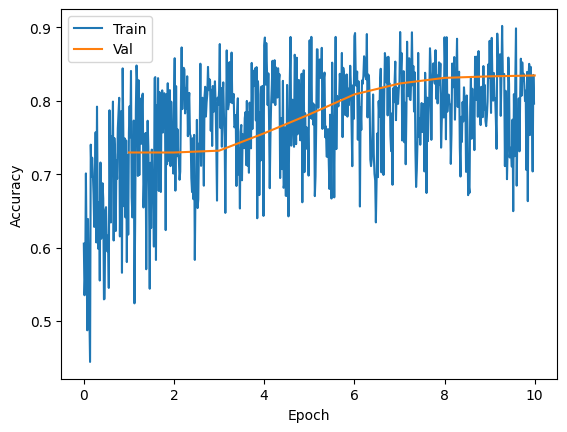

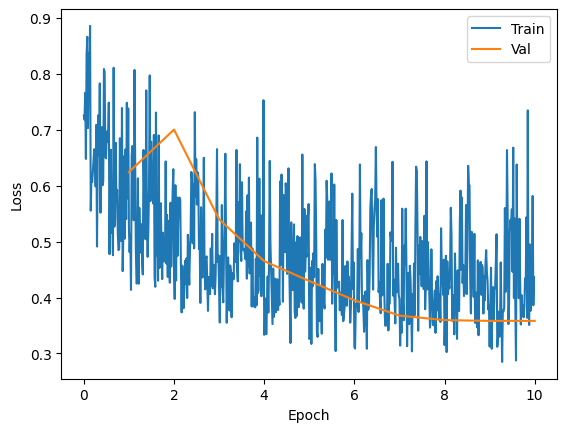

In [ ]:
# run training
bands = [0, 1, 4] #R/G/NDVI
%load_ext autoreload
%autoreload 2

torch.manual_seed(seed)
train_loader, val_loader, test_loader = create_dataloaders(data_dir=DATA_PATH, batch_size=batch_size, bands=bands)



results = run_training(experiment_name=f"Deeplabv3+_RGNIR_lr_{learning_rate}_num_epochs_{max_epochs}",
                        model=model,
                        num_epochs=max_epochs,
                        optimizer=optimizer,
                        criterion=criterion,
                        train_dl=train_loader,
                        val_dl=val_loader,
                        scheduler=scheduler,
                        lr=learning_rate,
                        batch_size=batch_size,
                        device=device,
                        project_name=project_name
                        )

In [ ]:
result = evaluate(model, device, test_loader, criterion)
print(result)

(0.40172064599215773, 0.8152438399167087, 0.5866925011882483, 0.7838346909136832, 0.6999413219219947, 0.7395163218441932)


In [ ]:
result = evaluate(model, device, val_loader, criterion)
print(result)

(0.3582471390831032, 0.8344121668316156, 0.48445233597846377, 0.7543293540415059, 0.5752066335632438, 0.6527017732221644)


In [ ]:
loader = iter(test_loader)

Visualsing 16 examples


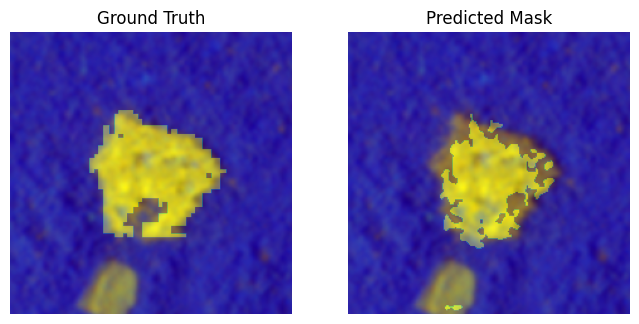

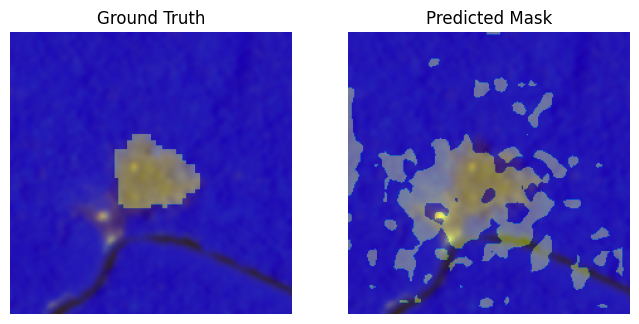

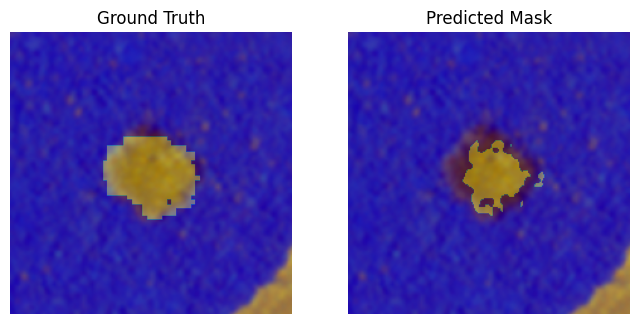

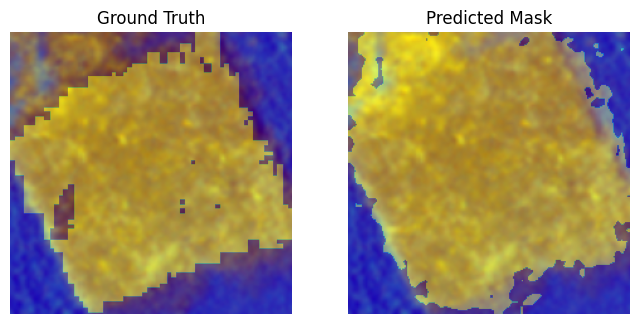

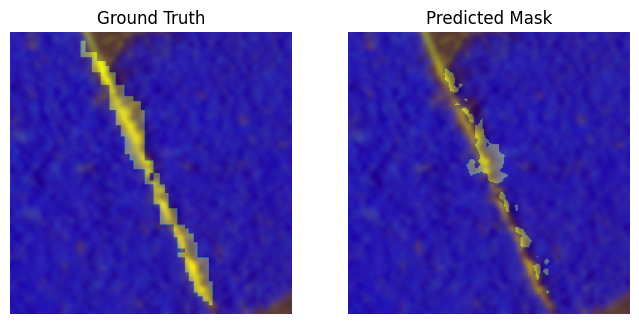

...

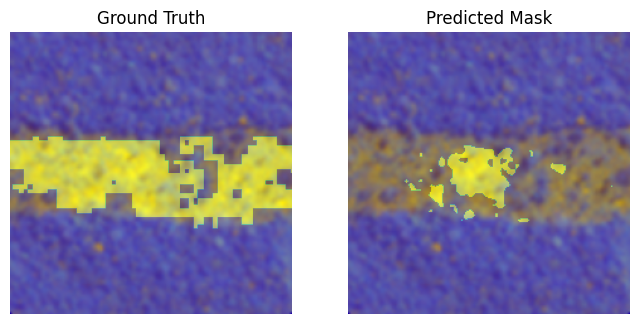

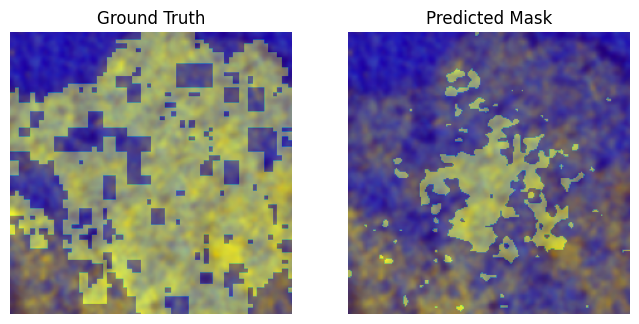

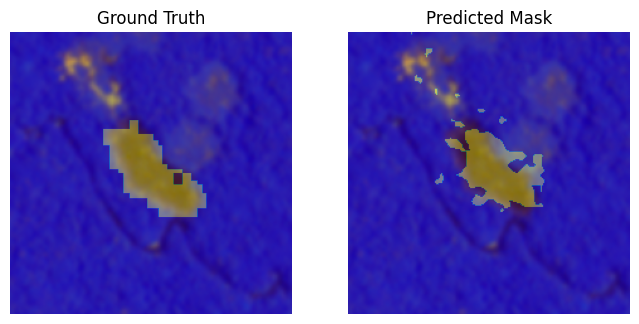

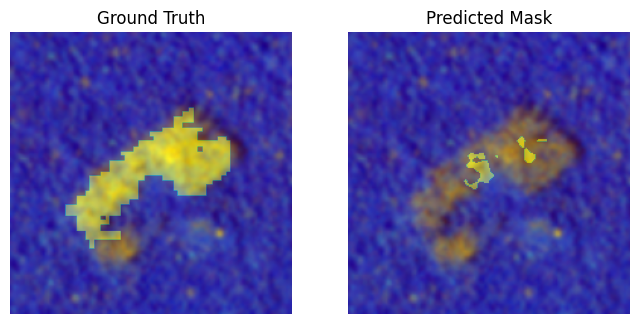

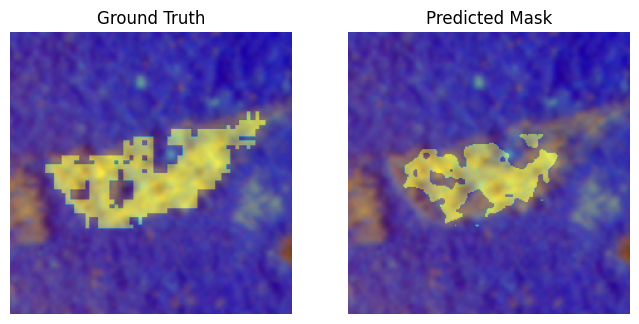

In [ ]:
batch_sample, batch_mask = next(loader)
batch_sample, batch_mask = batch_sample.to(device), batch_mask.to(device)
batch_output = model(batch_sample)
batch_predictions = batch_output.argmax(dim=1)
visualise_batch_predictions(batch_sample, batch_mask.unsqueeze(1), batch_predictions.unsqueeze(1), rescale=True, bands=bands)